In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
print("running")

running


In [3]:
!git clone https://github.com/ultralytics/ultralytics.git
%cd ultralytics


fatal: destination path 'ultralytics' already exists and is not an empty directory.
/kaggle/working/ultralytics/ultralytics


In [5]:
!pip install ultralytics opencv-python-headless


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.2/881.2 kB 20.1 MB/s eta 0:00:0000:01


In [6]:
import os
import cv2
import numpy as np

# Define class mapping for DOTA
class_mapping = {
    'plane': 0,
    'ship': 1,
    'storage-tank': 2,
    'baseball-diamond': 3,
    'tennis-court': 4,
    'basketball-court': 5,
    'ground-track-field': 6,
    'harbor': 7,
    'bridge': 8,
    'large-vehicle': 9,
    'small-vehicle': 10,
    'helicopter': 11,
    'roundabout': 12,
    'soccer-ball-field': 13,
    'swimming-pool': 14,
    'ground-track-field': 15
}

# Function to convert DOTA annotations to YOLO format
def convert_dota_to_yolo(txt_input_path, img_path, yolo_output_path):
    # Read annotation file
    with open(txt_input_path, 'r') as f:
        lines = f.readlines()
    
    # Image dimensions
    img = cv2.imread(img_path)
    h, w, _ = img.shape
    
    # YOLO formatted annotations
    yolo_annotations = []

    # Process each line in the annotation
    for line in lines:
        points = line.strip().split()
        if len(points) < 9:
            continue

        # Extract x, y points and class name
        x1, y1, x2, y2, x3, y3, x4, y4 = map(float, points[:8])
        class_name = points[8]
        
        if class_name not in class_mapping:
            continue
        
        class_id = class_mapping[class_name]
        
        # Calculate center x, center y, width, and height of bounding box
        x_coords = [x1, x2, x3, x4]
        y_coords = [y1, y2, y3, y4]
        
        x_center = (min(x_coords) + max(x_coords)) / 2.0 / w
        y_center = (min(y_coords) + max(y_coords)) / 2.0 / h
        bbox_width = (max(x_coords) - min(x_coords)) / w
        bbox_height = (max(y_coords) - min(y_coords)) / h

        # YOLO format: class_id x_center y_center width height
        yolo_annotations.append(f"{class_id} {x_center} {y_center} {bbox_width} {bbox_height}\n")
    
    # Write YOLO annotations to file
    os.makedirs(yolo_output_path, exist_ok=True)
    yolo_annotation_file = os.path.join(yolo_output_path, os.path.basename(txt_input_path))
    with open(yolo_annotation_file, 'w') as f:
        f.writelines(yolo_annotations)

# Convert training and validation annotations
train_images_dir = '/kaggle/input/dota-dataset-complete-new/DOTA_DATASET(SELF_MADE)/training_set_dota/dota_images'
train_annotations_dir = '/kaggle/input/dota-dataset-complete-new/DOTA_DATASET(SELF_MADE)/training_set_dota/trainset_reclabelTxt'
train_yolo_annotations_dir = '/kaggle/working/yolo_train_annotations'

val_images_dir = '/kaggle/input/dota-dataset-complete-new/DOTA_DATASET(SELF_MADE)/validation_set_dota/images'
val_annotations_dir = '/kaggle/input/dota-dataset-complete-new/DOTA_DATASET(SELF_MADE)/validation_set_dota/valset_reclabelTxt'
val_yolo_annotations_dir = '/kaggle/working/yolo_val_annotations'

# Loop through files and convert
for annotation_file in os.listdir(train_annotations_dir):
    img_file = os.path.join(train_images_dir, annotation_file.replace('.txt', '.png'))
    annotation_path = os.path.join(train_annotations_dir, annotation_file)
    convert_dota_to_yolo(annotation_path, img_file, train_yolo_annotations_dir)

for annotation_file in os.listdir(val_annotations_dir):
    img_file = os.path.join(val_images_dir, annotation_file.replace('.txt', '.png'))
    annotation_path = os.path.join(val_annotations_dir, annotation_file)
    convert_dota_to_yolo(annotation_path, img_file, val_yolo_annotations_dir)


In [7]:
# Directory structure
!mkdir -p /kaggle/working/datasets/dota_yolo/images/train
!mkdir -p /kaggle/working/datasets/dota_yolo/images/val
!mkdir -p /kaggle/working/datasets/dota_yolo/labels/train
!mkdir -p /kaggle/working/datasets/dota_yolo/labels/val

# Copy images and labels to YOLO dataset directories
import shutil

# Training images and labels
for img_file in os.listdir(train_images_dir):
    shutil.copy(os.path.join(train_images_dir, img_file), '/kaggle/working/datasets/dota_yolo/images/train/')
for label_file in os.listdir(train_yolo_annotations_dir):
    shutil.copy(os.path.join(train_yolo_annotations_dir, label_file), '/kaggle/working/datasets/dota_yolo/labels/train/')

# Validation images and labels
for img_file in os.listdir(val_images_dir):
    shutil.copy(os.path.join(val_images_dir, img_file), '/kaggle/working/datasets/dota_yolo/images/val/')
for label_file in os.listdir(val_yolo_annotations_dir):
    shutil.copy(os.path.join(val_yolo_annotations_dir, label_file), '/kaggle/working/datasets/dota_yolo/labels/val/')


In [8]:
# Define the YAML file for YOLOv8 dataset configuration
yaml_content = """
path: /kaggle/working/datasets/dota_yolo
train: images/train
val: images/val
names:
  0: plane
  1: ship
  2: storage-tank
  3: baseball-diamond
  4: tennis-court
  5: basketball-court
  6: ground-track-field
  7: harbor
  8: bridge
  9: large-vehicle
  10: small-vehicle
  11: helicopter
  12: roundabout
  13: soccer-ball-field
  14: swimming-pool
  15: ground-track-field
"""

# Save YAML file
with open('/kaggle/working/dota_dataset.yaml', 'w') as f:
    f.write(yaml_content)


# LOADING  yolov8n MODEL

In [9]:
from ultralytics import YOLO

# Initialize YOLOv8 model (use 'yolov8n' for nano, 'yolov8s' for small, etc.)
model = YOLO('yolov8n.pt')  # You can replace 'yolov8n.pt' with other YOLOv8 model versions

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 95.6MB/s]


# TRAINING 

In [10]:
model.train(data='/kaggle/working/dota_dataset.yaml', epochs=150, imgsz=640, batch=16)


Ultralytics 8.3.28 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/dota_dataset.yaml, epochs=150, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=Tr

100%|██████████| 755k/755k [00:00<00:00, 19.6MB/s]
2024-11-09 04:17:00,842	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-11-09 04:17:02,099	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=16

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 89.5MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/datasets/dota_yolo/labels/train... 1411 images, 2 backgrounds, 1 corrupt: 100%|██████████| 1411/1411 [01:01<00:00, 22.76it/s]

train: WARNING ⚠️ /kaggle/working/datasets/dota_yolo/images/train/P1872.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.6534      1.8034      1.7907      1.7744      1.7483       1.723      1.6903      1.8182      1.6506      1.6087      1.6596       1.213        1.61      1.5594        1.51      1.5529      1.4456      1.4922      1.3925       1.364      1.3362       1.822      1.8425      1.8735      2.0144      2.2527
       2.097      2.1098       2.178      2.2118      2.2618      2.2772      2.2437      2.1674      2.0553      2.0337      2.0154      1.9993       1.998      1.9395      1.8671      1.8864      1.9115      1.9278      1.2735      1.1513      1.2916      1.1644      1.1396      1.3352      1.4364      1.2961
      1.1785      1.1532      1.2294      1.2884      1.3137       1.033      1.0843      1.0808      1.0927      1.0347      2.3171      2.2918      2.3637      2.4091       2.667      2.7528      2.7749      2.4934      2

train: New cache created: /kaggle/working/datasets/dota_yolo/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/datasets/dota_yolo/labels/val... 458 images, 2 backgrounds, 0 corrupt: 100%|██████████| 458/458 [00:19<00:00, 23.63it/s]

val: New cache created: /kaggle/working/datasets/dota_yolo/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0005, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      9.92G      2.256      3.909      1.251       1174        640: 100%|██████████| 89/89 [01:49<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:21<00:00,  1.43s/it]

                   all        458      28853      0.725     0.0899     0.0896     0.0561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150     0.468G      2.135      2.375      1.104        252        640: 100%|██████████| 89/89 [01:43<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.30s/it]


                   all        458      28853       0.66       0.16      0.157     0.0891

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150      15.2G      2.041      1.881      1.073        486        640: 100%|██████████| 89/89 [01:38<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.30s/it]


                   all        458      28853      0.573      0.202      0.192      0.103

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150      15.5G      1.949      1.686      1.059        201        640: 100%|██████████| 89/89 [01:39<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.21s/it]


                   all        458      28853      0.573      0.224       0.22       0.12

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150      11.5G      1.881      1.573      1.042         33        640: 100%|██████████| 89/89 [01:37<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.20s/it]


                   all        458      28853       0.54      0.243       0.24      0.134

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150      16.6G      1.858      1.477      1.034       1024        640: 100%|██████████| 89/89 [01:40<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.26s/it]


                   all        458      28853      0.626      0.251      0.255      0.142

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150      13.4G      1.799      1.368      1.018        207        640: 100%|██████████| 89/89 [01:38<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.28s/it]


                   all        458      28853      0.676      0.262      0.276      0.158

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150      10.1G      1.743      1.329       1.01         72        640: 100%|██████████| 89/89 [01:38<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.25s/it]


                   all        458      28853      0.615      0.274      0.275      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      13.8G      1.736      1.326      1.004        111        640: 100%|██████████| 89/89 [01:37<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.29s/it]


                   all        458      28853      0.634      0.271       0.28       0.16

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150       8.6G      1.738      1.296      1.003         56        640: 100%|██████████| 89/89 [01:39<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.27s/it]

                   all        458      28853      0.548      0.286      0.296      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150        14G      1.712      1.275     0.9985        278        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.35s/it]


                   all        458      28853      0.696      0.267      0.282      0.158

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150      10.5G      1.716       1.26     0.9955        142        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.26s/it]


                   all        458      28853      0.665      0.304       0.31      0.178

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150       8.1G      1.673      1.209      0.987         87        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.21s/it]


                   all        458      28853      0.651      0.298      0.312       0.18

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150       9.7G      1.672      1.195     0.9868        423        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.28s/it]


                   all        458      28853      0.693      0.311      0.327      0.187

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150      11.2G      1.653      1.191     0.9833         72        640: 100%|██████████| 89/89 [01:37<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.36s/it]


                   all        458      28853      0.731      0.288      0.322      0.184

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      15.4G       1.66       1.16     0.9835         29        640: 100%|██████████| 89/89 [01:35<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.28s/it]


                   all        458      28853      0.637      0.306      0.332      0.191

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      13.8G      1.624      1.148     0.9794         55        640: 100%|██████████| 89/89 [01:37<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.30s/it]


                   all        458      28853      0.635      0.296      0.317      0.185

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      14.5G      1.627      1.141     0.9744         78        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.27s/it]


                   all        458      28853      0.641      0.314      0.336      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150      15.5G      1.633      1.141     0.9723        309        640: 100%|██████████| 89/89 [01:38<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.21s/it]


                   all        458      28853      0.696      0.321      0.343        0.2

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150      9.73G      1.598      1.097     0.9685        107        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.36s/it]


                   all        458      28853      0.707      0.327      0.354      0.205

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150       9.8G      1.586      1.096     0.9676        159        640: 100%|██████████| 89/89 [01:33<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.30s/it]


                   all        458      28853      0.693       0.32      0.349      0.205

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      15.4G       1.57      1.087     0.9673        252        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:22<00:00,  1.48s/it]

                   all        458      28853      0.724      0.316      0.348      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      14.4G       1.61      1.081     0.9671         76        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.28s/it]


                   all        458      28853      0.697      0.322      0.353      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150      9.46G      1.563      1.078     0.9616        151        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.36s/it]


                   all        458      28853      0.631      0.328       0.35      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      10.2G      1.542      1.049     0.9594        161        640: 100%|██████████| 89/89 [01:37<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.23s/it]


                   all        458      28853      0.648      0.315      0.347      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150      16.2G      1.559      1.061     0.9564        177        640: 100%|██████████| 89/89 [01:37<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.13s/it]


                   all        458      28853       0.68      0.326      0.356      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150      13.8G      1.547       1.03     0.9588         66        640: 100%|██████████| 89/89 [01:35<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.24s/it]


                   all        458      28853       0.71      0.327      0.355      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      14.5G      1.551      1.039      0.951         49        640: 100%|██████████| 89/89 [01:35<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.27s/it]


                   all        458      28853      0.706       0.32      0.351      0.202

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150      16.2G       1.56      1.025     0.9513        257        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.29s/it]


                   all        458      28853      0.687      0.342      0.363      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150      8.56G      1.541      1.028     0.9535        297        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.24s/it]


                   all        458      28853      0.696       0.33      0.367      0.217

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150      14.2G      1.541      1.018     0.9515        160        640: 100%|██████████| 89/89 [01:40<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.15s/it]


                   all        458      28853      0.716      0.336      0.369      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      13.5G      1.512      1.009     0.9502        152        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.32s/it]


                   all        458      28853      0.686      0.335      0.365      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      11.3G      1.515      1.006     0.9471        143        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.21s/it]


                   all        458      28853      0.718      0.321       0.36      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150      10.3G      1.547     0.9983     0.9501        528        640: 100%|██████████| 89/89 [01:38<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.30s/it]


                   all        458      28853      0.639      0.347      0.369      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150      16.4G        1.5     0.9886     0.9482         51        640: 100%|██████████| 89/89 [01:37<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.16s/it]


                   all        458      28853      0.625      0.354      0.376      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      15.1G      1.532      1.006     0.9452        370        640: 100%|██████████| 89/89 [01:37<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.21s/it]


                   all        458      28853      0.671       0.34      0.369       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150      8.58G      1.492     0.9735      0.944         94        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.38s/it]

                   all        458      28853      0.661      0.346       0.38      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      12.9G      1.512     0.9774     0.9418        158        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.24s/it]


                   all        458      28853       0.62      0.357      0.377      0.225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150      15.6G      1.492     0.9694      0.939         50        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.31s/it]


                   all        458      28853      0.641      0.339      0.376      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      14.3G      1.488     0.9576     0.9348        190        640: 100%|██████████| 89/89 [01:34<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.20s/it]


                   all        458      28853      0.596      0.361      0.379      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150      10.1G      1.488     0.9562     0.9372         84        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.25s/it]


                   all        458      28853      0.592      0.357      0.378      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      15.5G      1.486     0.9532     0.9386        119        640: 100%|██████████| 89/89 [01:39<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.37s/it]


                   all        458      28853      0.629      0.351       0.38      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150      9.41G      1.484     0.9441     0.9379         89        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.30s/it]


                   all        458      28853      0.698       0.35      0.385      0.225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      13.7G      1.477     0.9402     0.9367         67        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.39s/it]


                   all        458      28853      0.612       0.34      0.374       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      15.6G      1.473     0.9434     0.9347        147        640: 100%|██████████| 89/89 [01:34<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.25s/it]


                   all        458      28853      0.714      0.351      0.388       0.23

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150        13G      1.433     0.9203     0.9361         17        640: 100%|██████████| 89/89 [01:38<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.24s/it]


                   all        458      28853      0.692       0.35      0.385      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150      10.4G      1.463     0.9224     0.9312        154        640: 100%|██████████| 89/89 [01:35<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.20s/it]


                   all        458      28853      0.668      0.361      0.388       0.23

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150        14G       1.44     0.9279     0.9326        386        640: 100%|██████████| 89/89 [01:35<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.22s/it]


                   all        458      28853      0.595      0.356      0.376      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      15.1G      1.456     0.9223     0.9305         64        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.34s/it]


                   all        458      28853      0.701      0.348      0.381       0.23

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      14.9G      1.464     0.9285     0.9324         85        640: 100%|██████████| 89/89 [01:35<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.18s/it]


                   all        458      28853      0.687      0.348      0.376      0.225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150      16.2G      1.472     0.9042      0.928        338        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.29s/it]


                   all        458      28853      0.636       0.36       0.39      0.234

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      14.7G      1.451     0.9009     0.9266         44        640: 100%|██████████| 89/89 [01:38<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.14s/it]


                   all        458      28853      0.695      0.358      0.388      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      16.2G      1.454     0.9125     0.9299         24        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.21s/it]


                   all        458      28853      0.605      0.358      0.384      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150      16.2G      1.437     0.9041     0.9256        305        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.29s/it]


                   all        458      28853      0.676      0.352      0.387      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      14.6G      1.447     0.9104     0.9285         24        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.31s/it]


                   all        458      28853      0.619      0.367      0.395      0.241

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      14.3G      1.426     0.8973     0.9286         22        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.39s/it]


                   all        458      28853      0.625      0.368      0.388      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      8.86G      1.441      0.897      0.928        121        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.21s/it]


                   all        458      28853      0.686      0.365      0.397      0.238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      15.2G      1.429      0.884     0.9221         33        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.21s/it]


                   all        458      28853      0.718      0.355      0.393      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      10.8G      1.416     0.8904     0.9283         10        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.22s/it]


                   all        458      28853      0.648      0.362      0.394      0.234

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      12.8G      1.416     0.8821      0.923        156        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.28s/it]


                   all        458      28853      0.693      0.361      0.393      0.238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      9.79G      1.428     0.9037     0.9273        223        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.23s/it]


                   all        458      28853       0.67      0.368      0.397      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150      15.8G      1.409      0.884     0.9261        183        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.31s/it]


                   all        458      28853      0.673      0.372      0.397      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150      10.5G      1.404     0.8658     0.9201         63        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.37s/it]


                   all        458      28853      0.696      0.365      0.401      0.241

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      16.6G      1.402     0.8624     0.9235         20        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.24s/it]


                   all        458      28853      0.706      0.358        0.4      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      11.5G      1.399     0.8602       0.92        230        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.37s/it]


                   all        458      28853      0.701      0.363        0.4       0.24

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150      15.3G      1.381     0.8518     0.9162         11        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.28s/it]


                   all        458      28853      0.617      0.378      0.401      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      12.1G      1.388     0.8551     0.9209         81        640: 100%|██████████| 89/89 [01:37<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


                   all        458      28853       0.72      0.359      0.401      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      10.6G      1.386      0.863     0.9219         39        640: 100%|██████████| 89/89 [01:37<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.27s/it]


                   all        458      28853      0.642      0.369      0.398      0.241

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150      13.7G      1.419     0.8711      0.922        671        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.37s/it]


                   all        458      28853      0.685      0.365      0.403      0.245

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150      12.7G      1.398     0.8555     0.9169        122        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.25s/it]


                   all        458      28853      0.687      0.372      0.404      0.247

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150      14.1G      1.393     0.8494      0.918        120        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.25s/it]


                   all        458      28853      0.685      0.363      0.397      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      15.2G      1.408     0.8567     0.9182        144        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.28s/it]


                   all        458      28853       0.63      0.382      0.405      0.246

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      12.8G      1.388     0.8441     0.9159        197        640: 100%|██████████| 89/89 [01:36<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.17s/it]


                   all        458      28853      0.678      0.373      0.403      0.244

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150      14.8G      1.382     0.8311     0.9113         59        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.25s/it]


                   all        458      28853      0.666      0.369      0.404      0.242

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      11.1G      1.371     0.8367      0.914         50        640: 100%|██████████| 89/89 [01:34<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:21<00:00,  1.41s/it]

                   all        458      28853      0.636      0.381      0.406      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150      8.72G      1.392     0.8386     0.9119        100        640: 100%|██████████| 89/89 [01:32<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.29s/it]


                   all        458      28853      0.681      0.366      0.405      0.242

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150      13.8G      1.356     0.8235     0.9108        235        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.30s/it]


                   all        458      28853      0.703      0.373      0.405      0.246

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150      15.6G      1.367     0.8387     0.9119        362        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.35s/it]


                   all        458      28853      0.636      0.371      0.403      0.244

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150      15.7G      1.376     0.8332     0.9123        131        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.14s/it]


                   all        458      28853      0.648      0.363      0.404      0.248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150      15.7G      1.392     0.8338     0.9078        406        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.35s/it]


                   all        458      28853      0.685      0.375      0.402      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150        13G      1.352     0.8142       0.91        456        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.22s/it]


                   all        458      28853      0.655      0.381      0.404      0.248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150      15.9G      1.357     0.8281     0.9112        131        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.16s/it]


                   all        458      28853      0.686      0.367      0.406      0.247

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      10.9G       1.37     0.8281     0.9126        395        640: 100%|██████████| 89/89 [01:38<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.30s/it]


                   all        458      28853      0.663      0.377      0.408       0.25

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150      15.8G      1.373     0.8214     0.9033        339        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:16<00:00,  1.13s/it]


                   all        458      28853      0.679       0.37      0.407      0.246

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150      14.1G      1.348     0.8266     0.9086         30        640: 100%|██████████| 89/89 [01:36<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.26s/it]


                   all        458      28853      0.651      0.376      0.408      0.248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150        12G      1.376     0.8252     0.9086        136        640: 100%|██████████| 89/89 [01:36<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.14s/it]


                   all        458      28853      0.672      0.375      0.405      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150        13G      1.366     0.8297     0.9129         47        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.32s/it]


                   all        458      28853      0.649       0.37      0.407      0.248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      12.7G      1.329     0.8071     0.9065        220        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.19s/it]


                   all        458      28853      0.606      0.386      0.411      0.252

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      15.5G      1.345     0.8157      0.907        242        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.31s/it]


                   all        458      28853      0.665      0.364      0.401      0.245

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150        13G       1.35     0.8145     0.9033         22        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.25s/it]


                   all        458      28853      0.693      0.379       0.41      0.252

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150      15.1G      1.343     0.8091     0.9069         71        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.29s/it]

                   all        458      28853       0.68      0.379      0.406      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150      13.4G      1.352     0.8004     0.9052         22        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.25s/it]


                   all        458      28853      0.691      0.382      0.415      0.253

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      15.9G      1.318     0.7908     0.9013        298        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.19s/it]


                   all        458      28853      0.686      0.377      0.408       0.25

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150      13.8G      1.329     0.7964     0.9033        108        640: 100%|██████████| 89/89 [01:34<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.18s/it]


                   all        458      28853      0.655      0.379      0.408      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150      10.8G      1.314     0.7897     0.9037         94        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.36s/it]


                   all        458      28853      0.654      0.396      0.414      0.252

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150        14G      1.355     0.8034     0.9083        282        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.26s/it]


                   all        458      28853       0.65      0.393      0.416      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150      15.2G      1.315     0.7872     0.9014        364        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.22s/it]


                   all        458      28853      0.667       0.38      0.412      0.254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150      16.2G      1.327      0.791     0.9026         59        640: 100%|██████████| 89/89 [01:36<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.38s/it]


                   all        458      28853      0.639      0.388       0.41      0.251

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150      13.6G      1.339     0.7916     0.9008        339        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.20s/it]


                   all        458      28853      0.651      0.383      0.406      0.247

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      12.4G      1.333      0.794     0.9037         22        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.29s/it]


                   all        458      28853      0.657      0.379      0.408      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150      16.2G      1.327     0.7891     0.9009         23        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.25s/it]


                   all        458      28853      0.701      0.386      0.415      0.255

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150      14.8G       1.34       0.79     0.9048        189        640: 100%|██████████| 89/89 [01:35<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.19s/it]


                   all        458      28853      0.651       0.39      0.412      0.253

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150      15.8G      1.309     0.7849     0.9005         59        640: 100%|██████████| 89/89 [01:37<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.21s/it]


                   all        458      28853      0.646      0.384      0.413      0.254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150      10.7G      1.314     0.7786     0.8981         66        640: 100%|██████████| 89/89 [01:35<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.32s/it]


                   all        458      28853      0.648      0.386      0.415      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150      11.2G      1.351     0.7918     0.8992        223        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.35s/it]


                   all        458      28853      0.632      0.394      0.412      0.254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150      14.5G      1.315      0.785     0.8969        129        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.19s/it]


                   all        458      28853      0.658       0.39      0.413      0.254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150      10.3G      1.302     0.7752     0.8988        220        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:21<00:00,  1.40s/it]


                   all        458      28853      0.705       0.38      0.416      0.255

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150      13.9G      1.347     0.7902      0.898        236        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.25s/it]


                   all        458      28853      0.696      0.382      0.412      0.254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150      14.3G      1.315     0.7794     0.8998        106        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.32s/it]


                   all        458      28853       0.69      0.387      0.416      0.255

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150      9.01G       1.32     0.7829     0.8981        204        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.20s/it]


                   all        458      28853      0.701      0.386      0.415      0.254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150      12.6G      1.287     0.7665     0.8965        135        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.22s/it]


                   all        458      28853       0.67      0.393      0.414      0.253

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150      10.1G      1.293     0.7623     0.8949         17        640: 100%|██████████| 89/89 [01:33<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.31s/it]


                   all        458      28853      0.669      0.387      0.416      0.258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150      7.03G      1.321     0.7743     0.8994        145        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.29s/it]


                   all        458      28853      0.673      0.391      0.417      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150      14.2G       1.33     0.7815     0.8988         63        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.22s/it]


                   all        458      28853      0.664      0.388      0.417      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150      14.9G        1.3     0.7649     0.8963        185        640: 100%|██████████| 89/89 [01:36<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.22s/it]


                   all        458      28853      0.681      0.391      0.413      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150      13.2G      1.278     0.7512     0.8934         44        640: 100%|██████████| 89/89 [01:31<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.33s/it]


                   all        458      28853      0.682      0.384      0.416      0.258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150      10.8G      1.281     0.7539     0.8935         21        640: 100%|██████████| 89/89 [01:34<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.20s/it]


                   all        458      28853       0.69      0.388      0.419      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150      14.3G      1.311     0.7661     0.8975         96        640: 100%|██████████| 89/89 [01:35<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.28s/it]


                   all        458      28853      0.696      0.391      0.418      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150      16.4G      1.314     0.7659     0.8956        118        640: 100%|██████████| 89/89 [01:34<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.30s/it]


                   all        458      28853      0.697      0.391      0.418      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150      15.4G      1.304     0.7662     0.8963         40        640: 100%|██████████| 89/89 [01:37<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:15<00:00,  1.05s/it]


                   all        458      28853      0.694      0.383      0.417      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150      10.3G      1.316     0.7629     0.8939        145        640: 100%|██████████| 89/89 [01:38<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.34s/it]


                   all        458      28853      0.706      0.385      0.419      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150      10.3G      1.299     0.7629     0.8979          9        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


                   all        458      28853      0.719      0.388       0.42      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150      9.09G      1.281     0.7542     0.8971        162        640: 100%|██████████| 89/89 [01:36<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.30s/it]


                   all        458      28853      0.718      0.384      0.422       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150      11.2G      1.282      0.755     0.8912        117        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.21s/it]


                   all        458      28853      0.699      0.391      0.423       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150      14.8G      1.287     0.7596     0.8925        104        640: 100%|██████████| 89/89 [01:38<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:16<00:00,  1.08s/it]

                   all        458      28853        0.7      0.388      0.422      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150      12.4G      1.292     0.7627     0.8921       1202        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.16s/it]


                   all        458      28853       0.66      0.395      0.419      0.258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150      13.4G      1.307     0.7611     0.8923         60        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.28s/it]


                   all        458      28853      0.661      0.395       0.42      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/150      16.4G      1.297      0.749     0.8906        370        640: 100%|██████████| 89/89 [01:36<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.28s/it]


                   all        458      28853      0.678      0.391      0.419      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/150      14.4G      1.253      0.745     0.8914        204        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.28s/it]


                   all        458      28853      0.705      0.388      0.421      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/150      15.6G      1.288     0.7552      0.891        914        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.26s/it]


                   all        458      28853      0.684      0.392      0.422       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/150      12.2G      1.291     0.7577     0.8937        156        640: 100%|██████████| 89/89 [01:32<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:22<00:00,  1.47s/it]


                   all        458      28853      0.689      0.393      0.423       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/150      9.55G      1.286     0.7587     0.8948        495        640: 100%|██████████| 89/89 [01:35<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.23s/it]


                   all        458      28853      0.715      0.386      0.423      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/150      11.2G      1.281     0.7437     0.8887        311        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.30s/it]


                   all        458      28853      0.694       0.39      0.424       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/150      10.8G      1.298     0.7642      0.894        155        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.35s/it]


                   all        458      28853      0.691      0.391      0.421      0.258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/150       7.7G      1.267     0.7381     0.8906         74        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.37s/it]


                   all        458      28853      0.698      0.392      0.421      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/150      11.5G      1.279     0.7504     0.8878         87        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.30s/it]

                   all        458      28853        0.7      0.392      0.421       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/150      12.6G      1.259     0.7351      0.887         44        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.37s/it]


                   all        458      28853      0.715      0.387       0.42      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/150        15G       1.27     0.7409     0.8887        281        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.24s/it]


                   all        458      28853      0.686      0.387       0.42      0.259
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/150        13G      1.281     0.7695     0.8911         26        640: 100%|██████████| 89/89 [01:46<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.22s/it]


                   all        458      28853      0.657      0.388      0.415      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/150      11.5G      1.259     0.7323     0.8896         72        640: 100%|██████████| 89/89 [01:32<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.29s/it]


                   all        458      28853      0.665      0.387      0.414      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/150      11.9G      1.256     0.7314     0.8884        204        640: 100%|██████████| 89/89 [01:34<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.16s/it]


                   all        458      28853      0.678      0.385      0.418      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/150        15G      1.236     0.7216     0.8871         27        640: 100%|██████████| 89/89 [01:37<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.23s/it]


                   all        458      28853      0.691      0.386       0.42      0.258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/150      12.4G      1.249     0.7324     0.8859         37        640: 100%|██████████| 89/89 [01:34<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.24s/it]


                   all        458      28853      0.676      0.387       0.42      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/150      16.5G      1.247     0.7284     0.8849         28        640: 100%|██████████| 89/89 [01:32<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:21<00:00,  1.40s/it]


                   all        458      28853        0.7      0.379       0.42      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/150      13.7G       1.23      0.717     0.8867        142        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:19<00:00,  1.27s/it]


                   all        458      28853      0.661      0.389      0.419      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/150      10.9G      1.218       0.71     0.8842         25        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:18<00:00,  1.25s/it]


                   all        458      28853      0.676      0.389      0.423      0.261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/150       9.6G      1.232     0.7221     0.8844        152        640: 100%|██████████| 89/89 [01:33<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:21<00:00,  1.45s/it]


                   all        458      28853      0.682      0.388      0.423      0.261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/150      10.3G      1.253     0.7238     0.8844        176        640: 100%|██████████| 89/89 [01:31<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:20<00:00,  1.39s/it]


                   all        458      28853      0.673      0.393      0.423      0.262

150 epochs completed in 4.836 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 168 layers, 3,008,768 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:32<00:00,  2.15s/it]


                   all        458      28853      0.668      0.394      0.423      0.262
                 plane         70       2531      0.771      0.576      0.631      0.355
                  ship        108       8960      0.746       0.46      0.519      0.258
          storage-tank         55       2888      0.755       0.16      0.254      0.116
      baseball-diamond         53        214      0.803      0.325      0.426      0.255
          tennis-court         94        760      0.875      0.874      0.898      0.792
      basketball-court         35        132      0.673      0.379      0.392      0.288
                harbor        114       2090      0.663      0.614      0.637      0.332
                bridge         75        464      0.428     0.0582     0.0562     0.0209
         large-vehicle        110       4387       0.74      0.774       0.77      0.521
         small-vehicle        136       5438      0.538      0.501      0.481      0.244
            helicopte

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 15])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7aa4f362d960>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,   

#  SAVING THE MODEL

In [12]:
# Save the trained YOLO model
model.save('/kaggle/working/yolov8model_150epoch_for_dota_dataset.pt')

In [ ]:
model.train(data='your_dataset.yaml', epochs=1, save_dir='/kaggle/working/runs/detect/train3')


# COMPARING ANNOTATIONS ON VALIDATION IMAGES


image 1/1 /kaggle/input/dota-dataset-complete-new/DOTA_DATASET(SELF_MADE)/validation_set_dota/images/P2595.png: 640x384 11 tennis-courts, 1 small-vehicle, 2 soccer-ball-fields, 1 ground-track-field, 46.4ms
Speed: 4.1ms preprocess, 46.4ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 384)

image 1/1 /kaggle/input/dota-dataset-complete-new/DOTA_DATASET(SELF_MADE)/validation_set_dota/images/P0524.png: 640x640 2 ships, 10 harbors, 1 small-vehicle, 7.7ms
Speed: 2.9ms preprocess, 7.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/dota-dataset-complete-new/DOTA_DATASET(SELF_MADE)/validation_set_dota/images/P1651.png: 640x640 5 storage-tanks, 3 bridges, 1 ground-track-field, 7.0ms
Speed: 3.7ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/dota-dataset-complete-new/DOTA_DATASET(SELF_MADE)/validation_set_dota/images/P2242.png: 288x640 97 planes, 2 small-vehicles, 112.7ms
Spee

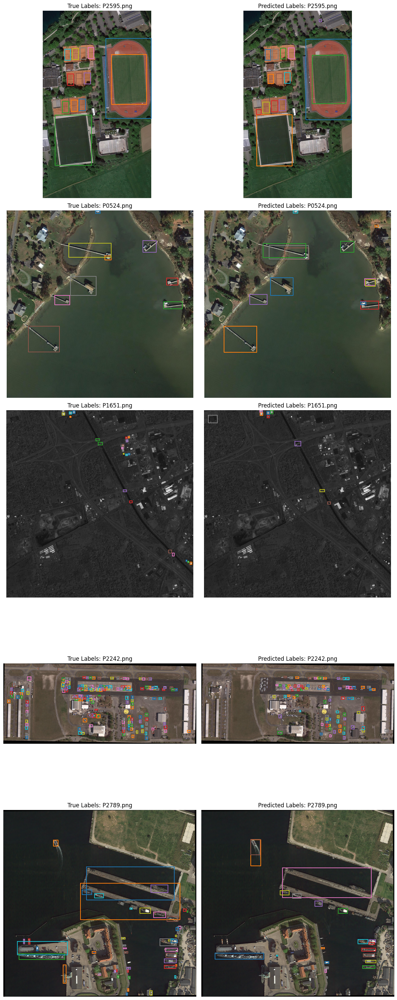

In [13]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

# Load the trained YOLOv8 model from local path
model = YOLO('/kaggle/working/yolov8model_150epoch_for_dota_dataset.pt')  # Replace with your actual model path

# Path to the images folder for evaluation
image_folder = Path('/kaggle/input/dota-dataset-complete-new/DOTA_DATASET(SELF_MADE)/validation_set_dota/images')
label_folder = Path('/kaggle/input/dota-dataset-complete-new/DOTA_DATASET(SELF_MADE)/validation_set_dota/valset_reclabelTxt')

# Function to load the ground truth labels from txt files
def load_labels(image_name):
    label_file = label_folder / f"{image_name.stem}.txt"
    with open(label_file, 'r') as file:
        labels = file.readlines()
    return labels

# Function to plot images with bounding boxes
def plot_image_with_boxes(image, labels, title="Image"):
    plt.imshow(image)
    for label in labels:
        coords = list(map(float, label.split()[:8]))
        class_name = label.split()[-2]
        coords = [(coords[i], coords[i+1]) for i in range(0, len(coords), 2)]
        coords.append(coords[0])  # To close the polygon
        x, y = zip(*coords)
        plt.plot(x, y, label=class_name)
    plt.title(title)
    plt.axis('off')

# Get the first 5 images from the dataset
image_paths = list(image_folder.glob("*.png"))[:5]

# Set up the plot
fig, axs = plt.subplots(5, 2, figsize=(12, 30))

# Loop through the images and plot them
for idx, image_path in enumerate(image_paths):
    # Load the image
    img = cv2.imread(str(image_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Load the ground truth labels
    true_labels = load_labels(image_path)

    # Predict using the YOLO model
    results = model(image_path)  # The results are returned as a list of results
    preds = results[0].boxes  # Accessing the prediction boxes (each result is a 'result' object)

    # Convert predictions to the format used by the ground truth labels
    pred_labels = []
    for pred in preds:
        # Extract center (x, y), width, height and confidence
        x_center, y_center, width, height = pred.xywh[0].tolist()
        conf = pred.conf[0].item()  # Confidence score
        class_idx = int(pred.cls[0].item())  # Class index
        
        # Convert from center-based (xywh) to corner-based (xyxy)
        x1 = x_center - width / 2
        y1 = y_center - height / 2
        x2 = x_center + width / 2
        y2 = y_center + height / 2
        
        pred_labels.append(f"{class_idx} {x1} {y1} {x2} {y2} {conf}")

    # Plot the image with true labels on the left
    axs[idx, 0].imshow(img)
    for true_label in true_labels:
        coords = list(map(float, true_label.split()[:8]))
        coords = [(coords[i], coords[i+1]) for i in range(0, len(coords), 2)]
        coords.append(coords[0])  # To close the polygon
        x, y = zip(*coords)
        axs[idx, 0].plot(x, y, label=true_label.split()[-2])
    axs[idx, 0].set_title(f"True Labels: {image_path.name}")
    axs[idx, 0].axis('off')

    # Plot the image with predicted labels on the right
    axs[idx, 1].imshow(img)
    for pred_label in pred_labels:
        # Extract bounding box coordinates from pred_label
        pred_info = pred_label.split()
        class_idx, x1, y1, x2, y2, conf = map(float, pred_info)
        
        # Plot the bounding box as a polygon
        coords = [(x1, y1), (x1, y2), (x2, y2), (x2, y1)]
        coords.append(coords[0])  # To close the polygon
        x, y = zip(*coords)
        axs[idx, 1].plot(x, y, label=f"Pred {int(class_idx)}")
    
    axs[idx, 1].set_title(f"Predicted Labels: {image_path.name}")
    axs[idx, 1].axis('off')

# Display the side-by-side comparison
plt.tight_layout()
plt.show()


# PREDICTING ANNOTATIONS ON TEST IMAGES


image 1/1 /kaggle/input/dota-dataset-complete-new/DOTA_DATASET(SELF_MADE)/test_set_dota/images/P1548.png: 640x640 5 storage-tanks, 1 bridge, 7.1ms
Speed: 4.0ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/dota-dataset-complete-new/DOTA_DATASET(SELF_MADE)/test_set_dota/images/P2312.png: 512x640 17 ships, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 /kaggle/input/dota-dataset-complete-new/DOTA_DATASET(SELF_MADE)/test_set_dota/images/P1588.png: 640x640 (no detections), 7.6ms
Speed: 3.8ms preprocess, 7.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/dota-dataset-complete-new/DOTA_DATASET(SELF_MADE)/test_set_dota/images/P0033.png: 448x640 12 planes, 1 helicopter, 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /kaggle/input/dota-dataset-complete-new/DO

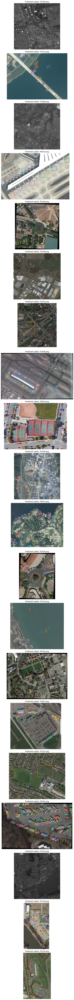

Predictions saved in YOLO format and visualized for up to 10 test images.


In [18]:
from ultralytics import YOLO
from pathlib import Path
import os
import cv2
import matplotlib.pyplot as plt

# Define paths
test_images_dir = Path('/kaggle/input/dota-dataset-complete-new/DOTA_DATASET(SELF_MADE)/test_set_dota/images')
test_output_dir = Path('/kaggle/working/yolo_test_annotations')

# Ensure output directory exists
os.makedirs(test_output_dir, exist_ok=True)

# Load the trained YOLOv8 model
model = YOLO('/kaggle/working/yolov8model_150epoch_for_dota_dataset.pt')  # Adjust path if necessary

# Function to save predictions in YOLO format
def save_yolo_format(preds, output_file):
    yolo_annotations = []
    for pred in preds:
        # YOLO format: class_id, x_center, y_center, width, height
        class_id = int(pred.cls[0].item())
        x_center, y_center, width, height = pred.xywh[0].tolist()
        yolo_annotations.append(f"{class_id} {x_center} {y_center} {width} {height}\n")
    
    with open(output_file, 'w') as f:
        f.writelines(yolo_annotations)

# Select 10 random test images
test_images = list(test_images_dir.glob("*.png"))[:20]  # Change [:10] to random.sample if truly random selection is needed

# Set up a 10x1 grid for side-by-side display
num_images = len(test_images)
fig, axs = plt.subplots(num_images, 1, figsize=(8, 5 * num_images))  # Set 10x1 layout

for idx, image_path in enumerate(test_images):
    # Run the model on each image
    results = model(image_path)
    
    # Get prediction boxes for the first result
    preds = results[0].boxes
    
    # Define the output file path
    output_file = test_output_dir / f"{image_path.stem}.txt"
    
    # Save predictions in YOLO format
    save_yolo_format(preds, output_file)

    # Load the image
    img = cv2.imread(str(image_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Plot the image with predicted labels
    ax = axs[idx]
    ax.imshow(img)
    for pred in preds:
        x_center, y_center, width, height = pred.xywh[0].tolist()
        class_id = int(pred.cls[0].item())
        
        # Convert from center-based (xywh) to corner-based (xyxy)
        x1 = x_center - width / 2
        y1 = y_center - height / 2
        x2 = x_center + width / 2
        y2 = y_center + height / 2
        
        # Plot the bounding box as a polygon
        coords = [(x1, y1), (x1, y2), (x2, y2), (x2, y1)]
        coords.append(coords[0])  # Close the polygon
        x, y = zip(*coords)
        ax.plot(x, y, label=f"Pred {class_id}")
    
    ax.set_title(f"Predicted Labels: {image_path.name}")
    ax.axis('off')

plt.tight_layout()
plt.show()

print("Predictions saved in YOLO format and visualized for up to 10 test images.")
